In [1]:
%%capture
from pathlib import Path

if Path.cwd().stem == "notebooks":
    %cd ..
    %load_ext autoreload
    %autoreload 2

In [2]:
import logging
from pathlib import Path

import holoviews as hv
import hvplot.polars  # noqa
import matplotlib.pyplot as plt
import neurokit2 as nk
import numpy as np
import polars as pl
import scipy.signal as signal
from icecream import ic
from polars import col

from src.data.database_manager import DatabaseManager
from src.data.quality_checks import check_sample_rate
from src.features.pupil import (
    _get_blink_segments,
    add_blink_threshold,
    average_pupils,
    extend_periods_around_blinks,
    # low_pass_filter_pupil,
    median_filter_pupil,
)
from src.features.resampling import interpolate_and_fill_nulls
from src.features.scaling import scale_min_max
from src.features.transforming import map_trials, merge_dfs
from src.features.utils import to_describe
from src.log_config import configure_logging

# from src.plots.confidence_intervals import plot_confidence_intervals
from src.plots.utils import prepare_multiline_hvplot

logger = logging.getLogger(__name__.rsplit(".", maxsplit=1)[-1])
configure_logging(
    stream_level=logging.DEBUG,
    ignore_libs=["matplotlib", "Comm", "bokeh", "tornado", "param", "numba"],
)

pl.Config.set_tbl_rows(12)  # for the 12 trials
hv.output(widget_location="bottom", size=130)

In [3]:
db = DatabaseManager()

In [4]:
exlcude_trials_with_measurement_problems = True
with db:
    pupil_with_blinks = db.get_table(
        "Raw_Pupil", exlcude_trials_with_measurement_problems
    )
    pupil = db.get_table("Feature_Pupil", exlcude_trials_with_measurement_problems)
    stimulus = db.get_table(
        "Feature_Stimulus", exlcude_trials_with_measurement_problems
    )
    trials = db.get_table("Trials", exlcude_trials_with_measurement_problems)

In [5]:
# Merge data dfs
df = merge_dfs(dfs=[pupil, stimulus])
# Merge with trial information
df = merge_dfs(
    dfs=[df, trials],
    on=["trial_id", "participant_id", "trial_number"],
)
df = interpolate_and_fill_nulls(df)  # fill gaps in the data

In [ ]:
df.hvplot(
    x="timestamp",
    y=["pupil_l_raw", "pupil_r_raw", "pupil"],
    groupby="trial_id",
)


BokehModel(combine_events=True, render_bundle={'docs_json': {'bdbe9ad4-a364-4fae-91af-8c1c2d0ed619': {'version…

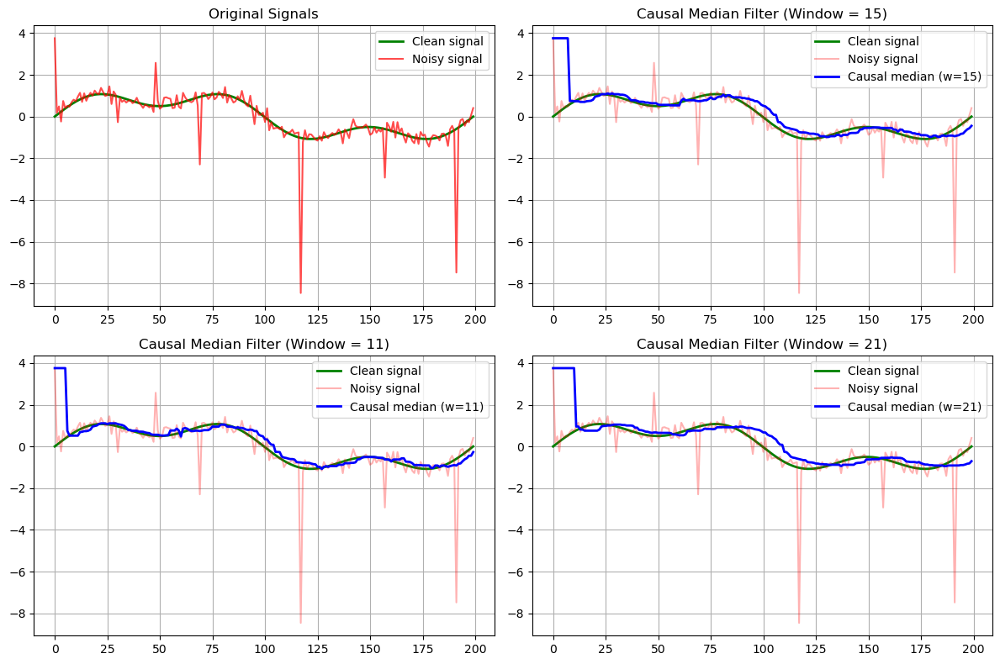

In [22]:
from collections import deque

from numpy.lib.stride_tricks import sliding_window_view
from scipy import ndimage


def causal_median_filter(signal, window_size):
    """
    Causal median filter using only current and past samples.

    Parameters:
    - signal: 1D array to filter
    - window_size: number of samples to include in median calculation

    Returns:
    - filtered_signal: 1D array of same length as input
    """
    filtered = np.zeros_like(signal)
    buffer = deque(maxlen=window_size)

    for i, sample in enumerate(signal):
        buffer.append(sample)
        # Take median of current buffer (only past + current samples)
        filtered[i] = np.median(list(buffer))

    return filtered


def causal_median_filter_vectorized(signal, window_size):
    """
    More efficient vectorized implementation using padding.
    """
    # Pad signal with first value repeated
    padded = np.pad(signal, (window_size - 1, 0), mode="edge")

    # Create sliding window view
    windowed = sliding_window_view(padded, window_size)

    # Take median along window axis
    return np.median(windowed, axis=1)


def causal_median_filter_scipy_approach(signal, window_size):
    """
    Using scipy's generic_filter with a custom function.
    """

    def causal_median(buffer):
        # buffer contains the neighborhood, we only want the "past" portion
        return np.median(buffer[: len(buffer) // 2 + 1])

    # Pad signal to handle boundaries
    padded = np.pad(signal, (window_size - 1, 0), mode="edge")

    # Apply filter - note: this still looks ahead, so we need to shift
    result = ndimage.generic_filter(
        padded, causal_median, size=window_size, mode="constant"
    )

    return result[window_size - 1 :]


# Example usage and comparison
if __name__ == "__main__":
    import matplotlib.pyplot as plt

    # Generate test signal with noise and outliers
    t = np.linspace(0, 2 * np.pi, 200)
    clean_signal = np.sin(t) + 0.5 * np.sin(3 * t)
    noise = 0.2 * np.random.randn(len(t))

    # Add some outliers
    outliers = np.zeros_like(t)
    outlier_indices = np.random.choice(len(t), 10, replace=False)
    outliers[outlier_indices] = 3 * np.random.randn(10)

    noisy_signal = clean_signal + noise + outliers

    # Apply different window sizes
    window_sizes = [15, 11, 21]

    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(clean_signal, "g-", label="Clean signal", linewidth=2)
    plt.plot(noisy_signal, "r-", alpha=0.7, label="Noisy signal")
    plt.legend()
    plt.title("Original Signals")
    plt.grid(True)

    for i, window_size in enumerate(window_sizes, 2):
        filtered = causal_median_filter_vectorized(noisy_signal, window_size)

        plt.subplot(2, 2, i)
        plt.plot(clean_signal, "g-", label="Clean signal", linewidth=2)
        plt.plot(noisy_signal, "r-", alpha=0.3, label="Noisy signal")
        plt.plot(filtered, "b-", label=f"Causal median (w={window_size})", linewidth=2)
        plt.legend()
        plt.title(f"Causal Median Filter (Window = {window_size})")
        plt.grid(True)

    plt.tight_layout()
    plt.show()

array([180, 300, 420])

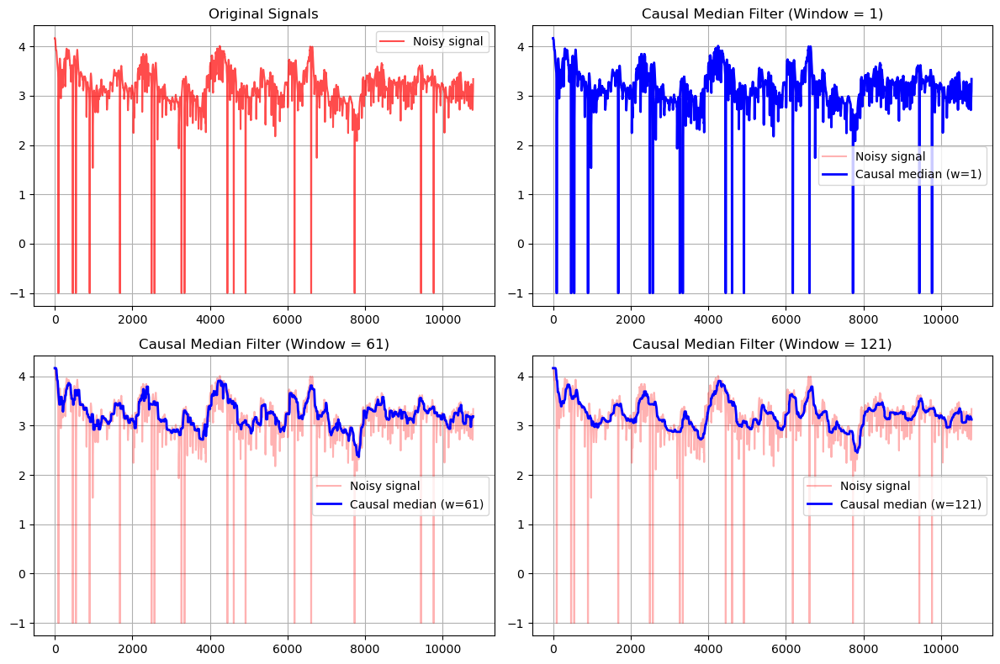

In [36]:
window_sizes = np.array([0, 1, 2]) * 60 + 1
window_sizes
sig = pupil_with_blinks.filter(trial_id=100).get_column("pupil_l_raw").to_numpy()

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(sig, "r-", alpha=0.7, label="Noisy signal")
plt.legend()
plt.title("Original Signals")
plt.grid(True)

for i, window_size in enumerate(window_sizes, 2):
    filtered = causal_median_filter_vectorized(sig, window_size)

    plt.subplot(2, 2, i)
    plt.plot(sig, "r-", alpha=0.3, label="Noisy signal")
    plt.plot(filtered, "b-", label=f"Causal median (w={window_size})", linewidth=2)
    plt.legend()
    plt.title(f"Causal Median Filter (Window = {window_size})")
    plt.grid(True)

plt.tight_layout()
plt.show()

In [11]:
pupil_with_blinks = add_blink_threshold(pupil_with_blinks)
pupil_with_blinks = extend_periods_around_blinks(pupil_with_blinks)
blink_segments = _get_blink_segments(pupil_with_blinks)
blink_segments

pupil,start_timestamp,end_timestamp,trial_id,participant_id,trial_number,duration
str,f64,f64,i64,i64,i64,f64
"""r""",297986.2146,298253.2178,1,1,1,267.0032
"""l""",297986.2146,298269.8418,1,1,1,283.6272
"""r""",365857.6722,366174.6898,1,1,1,317.0176
"""r""",379138.3794,379405.3074,1,1,1,266.928
"""l""",402296.0882,402646.4402,1,1,1,350.352
"""r""",402312.7714,402663.1186,1,1,1,350.3472
…,…,…,…,…,…,…
"""l""",2.6641e6,2.6645e6,332,28,12,417.1456
"""r""",2.6641e6,2.6645e6,332,28,12,417.0576


In [12]:
blink_segments.hvplot.hist(
    y="duration",
    bins=10000,
    xlabel="Duration (ms)",
    ylabel="Frequency",
    xlim=(0, 2000),
)

:Histogram   [duration]   (Count)

In [13]:
blink_segments.hvplot.hist(
    y="duration",
    bins=10000,
    xlabel="Duration (ms)",
    ylabel="Frequency",
    subplots=True,
    by="participant_id",
    width=300,
    height=200,
    xlim=(0, 500),
    xaxis="bare",
    yaxis="bare",
)

:NdLayout   [participant_id]
   :Histogram   [duration]   (Count)